<a href="https://colab.research.google.com/github/NucleiDatorum/Portfolio/blob/main/moscow_catering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<div style="background: #B0E0E6; padding: 5px; border: 1px solid SteelBlue; border-radius: 5px;">
<font color='4682B4'>
Для возможности просмотра интерактивных графиков, созданных при помощи библиотеки Plotly,<br> необходимо перейти по ссылке в Google Colab, поскольку в GitHub диаграммы Plotly не отображаются.</font>

<font color='DarkBlue' size=+2><b>Исследование заведений общественного питания Москвы</b></font><br>

**Описание проекта:**<br>
Данное исследование предназначено для инвесторов, <br>
которые хотят открыть своё собственное заведение общественного питания в Москве, <br>
но ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, и какими будут расположение, меню и цены. <br>
В идеале хотелось бы, чтобы это была <br>
такая же крутая и доступная кофейня как «Central Perk» из сериала "Друзья". <br>
Но в этой сфере большая конкуренция, ведь кофеен в крупных городах уже достаточно.

**Цель исследования:**<br>
Проанализировать заведения общественного питания Москвы на основе данных, <br>
полученных из сервисов Яндекс Карты и Яндекс Бизнес за лето 2022 года. <br>
Найти интересные особенности. Построить визуализации. <br>
Составить рекомендации для инвесторов.

# **Часть 1. Общая информация**

In [4]:
# импорт необходимых библиотек
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import style
import seaborn as sns
import plotly.express as px
import missingno as msno
import folium
from folium import Map, Choropleth
import warnings
warnings.filterwarnings('ignore')

In [5]:
# загрузка JSON-файла с границами округов Москвы
state_geo = '/content/admin_level_geomap.geojson'

In [6]:
# чтение файла с данными о заведениях общественного питания Москвы
df = pd.read_csv('/content/moscow_places.csv')
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


**Описание данных:**
- `name` - название заведения;
- `category` - категория (например, «кафе», «пиццерия» или «кофейня»);
- `address` - адрес;
- `district` - административный район, в котором находится заведение;
- `hours` - дни и часы работы;
- `lat` - широта географической точки, в которой находится заведение;
- `lng` - долгота географической точки, в которой находится заведение;
- `rating` - рейтинг по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- `price` - категория цен (например, «средние», «ниже среднего», «выше среднего»);
- `avg_bill` - средний диапазон цен;
- `middle_avg_bill` - средний чек;
- `middle_coffee_cup` - средняя стоимость одной чашки капучино;
- `chain` - является ли заведение сетевым: 0 - нет, 1 - да;
- `seats` - количество посадочных мест.

In [7]:
# общая информация о датасете
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


 ## **Вывод 1:**

- датасет содержит более 8 тысяч наблюдений по 14 признакам;
- в шести колонках есть пропущенные значения;
- шесть признаков являются числовыми - широта, долгота, рейтинг, средний чек, средняя стоимость чашки капучино и число посадочных мест;
- седьмой признак chain (сетевое заведение) по задумке - логический (да/нет);
- остальные признаки являются категориальными - название, категория заведения, адрес, район, режим работы, категория и диапазон цен;
- в столбце seats (количество посадочных мест) из-за наличия пропусков тип данных - дробные числа.

# **Часть 2. Предобработка данных**

## **2.1. Дубликаты**

In [8]:
f'Количество полных дубликатов = {df.duplicated().sum()}'

'Количество полных дубликатов = 0'

In [9]:
# приведем названия заведений к нижнему регистру
df.name = df.name.str.lower()

# посмотрим, сколько раз встречается каждое название
df.name.value_counts().reset_index()

,name,count
0,кафе,189
1,шоколадница,120
2,домино'с пицца,77
3,додо пицца,74
4,one price coffee,72
...,...,...
5507,ах... плов,1
5508,прошу к столу,1
5509,кофе-порт,1
5510,сметана,1


<div style="border:solid Chocolate 2px; padding: 40px">

189 заведений называются просто "Кафе", то есть, название совпадает с категорией.<br>
Также видим лидера по количеству точек - это сеть кофеен "Шоколадница".

In [10]:
# посмотрим, сколько раз встречается каждый адрес
df.address.value_counts().reset_index()

,address,count
0,"Москва, проспект Вернадского, 86В",28
1,"Москва, Усачёва улица, 26",26
2,"Москва, площадь Киевского Вокзала, 2",20
3,"Москва, Ярцевская улица, 19",20
4,"Москва, Каширское шоссе, 61Г",16
...,...,...
5748,"Москва, улица Герасима Курина, 6",1
5749,"Москва, Кутузовский проспект, 36, стр. 5",1
5750,"Москва, улица Мнёвники, 11",1
5751,"Москва, Западный административный округ, район...",1


<div style="border:solid Chocolate 2px; padding: 40px">

В списке есть адреса крупных торговых центров, рынков, парков и отелей.<br>
В таких местах, как правило, сосредоточено большое количество различных точек общественного питания. <br>
Другими словами, по одному и тому же адресу может располагаться множество заведений.<br>
Поэтому для определения дубликатов поищем заведения с одинаковым названием и одинаковыми географическими координатами:

In [11]:
# дубликаты по названию и координатам
df[df[['name', 'lat', 'lng']].duplicated()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0


<div style="border:solid Chocolate 2px; padding: 40px">

По данным из открытых источников в Москве есть только одно заведение с названием "More Poke".<br>
При этом в chain указано 1, т.е., сеть. <br>
Также из открытых источников известно, что "More Poke" - это франшиза гавайской кухни и она представена не только в Москве, но и в других российских городах (действительно, сеть).<br>
Дубликат удалим.

In [12]:
# удалим дубликат по индексу
df = df.drop (index=1511)

# проверим результат
f"Количество совпадений по названию и координатам = {len(df[df[['name', 'lat', 'lng']].duplicated()])}"

'Количество совпадений по названию и координатам = 0'

## **2.2. Пропуски**

In [13]:
# доля пропусков по каждой колонке в порядке убывания
(df
 .isna()
 .mean()
 .reset_index()
 .rename(columns={'index': 'название_столбца', 0: 'доля_пропусков'})
 .sort_values(by='доля_пропусков', ascending=False))

,название_столбца,доля_пропусков
11,middle_coffee_cup,0.936347
10,middle_avg_bill,0.625342
8,price,0.605592
9,avg_bill,0.545985
13,seats,0.429625
4,hours,0.063772
0,name,0.000000
1,category,0.000000
2,address,0.000000
3,district,0.000000


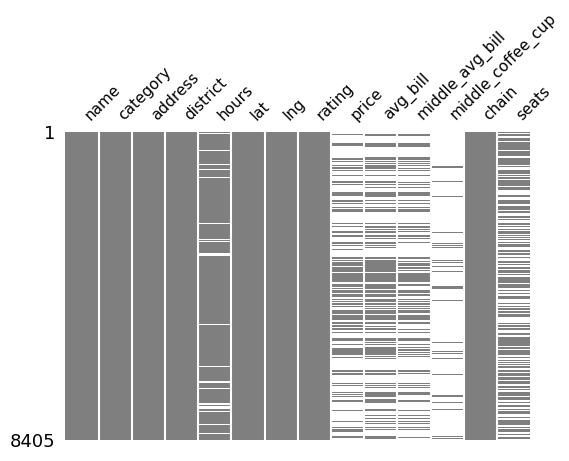

In [14]:
# визуализация распределения пропусков по столбцам
# при помощи библиотеки missingno
msno.matrix(df,
            figsize=(6,4),
            fontsize=11,
            sparkline=False,
            color=(0.50, 0.50, 0.50));

<div style="border:solid Chocolate 2px; padding: 40px">

В колонке со средней стоимостью чашки капучино более 90% пропусков.<br>
Как видим, пробелы по этому признаку совпадают с пробелами в `avg_bill`.<br>
Посмотрим на уникальные значения колонки `avg_bill`:

In [15]:
# несколько уникальных значений среднего диапазона цен
list(df.avg_bill.unique())[:10]

[nan,
 'Средний счёт:1500–1600 ₽',
 'Средний счёт:от 1000 ₽',
 'Цена чашки капучино:155–185 ₽',
 'Средний счёт:400–600 ₽',
 'Средний счёт:199 ₽',
 'Средний счёт:200–300 ₽',
 'Средний счёт:от 500 ₽',
 'Средний счёт:1000–1200 ₽',
 'Цена бокала пива:250–350 ₽']

<div style="border:solid Chocolate 2px; padding: 40px">

Из предоставленного к датасету описания известно:<br>
если в столбце со средним диапазоном `avg_bill` нет подстроки "Цена чашки капучино...", <br>
то в столбце `middle_coffee_cup` соответственно стоит пропуск.<br>
То же самое с колонкой со средним чеком `middle_avg_bill`: <br>
если в `avg_bill` нет подстроки "Средний счёт...", то в `middle_avg_bill` стоит пропуск.<br>
Кроме того, пропуски есть и в самом столбце `avg_bill`, что также нашло отражение в столбцах со средним чеком и средней ценой чашки капучино.

<div style="border:solid Chocolate 2px; padding: 40px">

С ценами также связан столбец `price`, в котором 60% пропусков. Восстановить эти данные не представляется возможным. <br>
Как и пропущенные значения в столбце с часами работы.<br>
Ещё один столбец с незаполненными данными - это количество посадочных мест `seats`.<br>
Можно предположить, что какая-то часть заведений работает на вынос и у них нет посадочных мест.<br>
Или это фаст-фуд, уличная еда.<br>
Но достоверно установить это на основе имеющихся данных мы не можем.<br><br>

Таким образом:<br>
числовые столбцы `middle_avg_bill`, `middle_coffee_cup` и `seats` оставим без изменений,<br>
а в категориальных `price` и `avg_bill` заменим пропуски на значение "неизвестно":

In [16]:
# замена пропусков на "неизвестно"
df.loc[df['price'].isna() == True, 'price'] = 'неизвестно'
df.loc[df['avg_bill'].isna() == True, 'avg_bill'] = 'неизвестно'

# проверка результата
df[['price', 'avg_bill']].isna().sum()

,0
price,0
avg_bill,0


## **2.3. Дополнительные столбцы**

Выделим название улицы из адреса заведения в отдельный столбец `street`.<br>
Добавим столбец `is_24/7` с указанием, работает ли заведение ежедневно и круглосуточно: False - нет, True - да.<br>
Для удобства визуализаций добавим в отдельный столбец `distr` сокращённые названия округов.

In [17]:
# новый столбец [street] с названиями улиц из столбца с адресом
df['street'] = df.address.str.split(', ').str[1]

# новый столбец [is_24/7] с обозначением круглосуточной работы без выходных
df['is_24/7'] = df.hours.str.contains(r'\ежедневно, круглосуточно')

# столбец с сокращенным названием округа
df['distr'] = df.district.str.split().str[0]

In [18]:
f'Количество строк, столбцов = {df.shape}'

'Количество строк, столбцов = (8405, 17)'

## **Вывод 2**:
- Поскольку в датасете присутствуют сетевые заведения с одинаковым названием, принято решение искать дубликаты по названию и координатам. Адрес также может совпадать, если заведения с одинаковым названием находятся в одном парке, например. У разных заведений может совпадать адрес и координаты, если они находятся в одном торговом центре. <br>
Таким образом, по названию и координатам найдено и удалено только одно совпадение.
- В 6 столбцах из 14 есть пропуски, восстановить которые не представляется возможным. <br>
Числовые столбцы оставили без изменений, в категориальных - пропуски заменили на "неизвестно".
- Добавили три новых столбца: `street`, `is_24/7` и `distr`.
- Обнаружили заведения, у которых название совпадает с категорией (например, кафе).

# **Часть 3. Анализ данных**

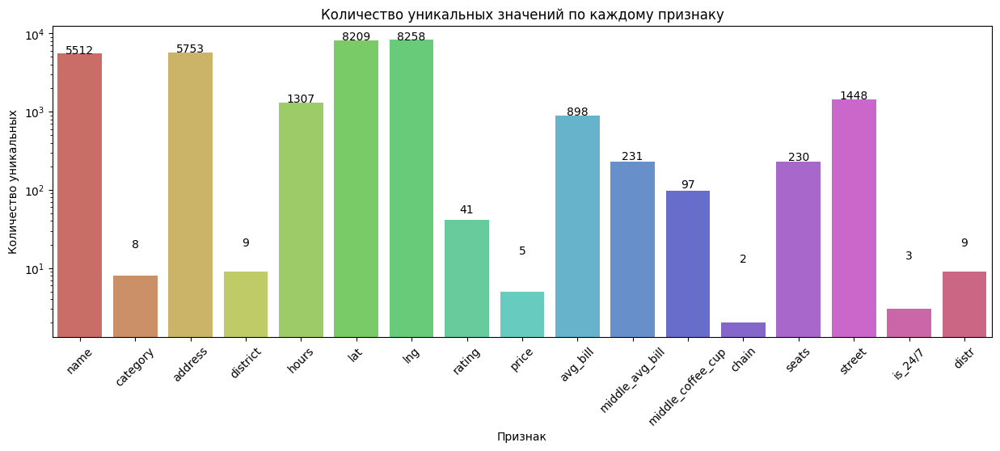

In [19]:
# визуализация количества уникальных значений по каждому столбцу
plt.figure(figsize=(15, 5))

cols = df.columns
uniques = [len(df[col].unique()) for col in cols]

ax = sns.barplot(x=cols,
                 y=uniques,
                 palette='hls',
                 log=True)
ax.set(xlabel='Признак',
       ylabel='Количество уникальных',
       title='Количество уникальных значений по каждому признаку')

for p, uniq in zip(ax.patches, uniques):
    ax.text(p.get_x() + p.get_width()/2.,
            uniq + 10,
            uniq,
            ha='center')

ax.set_xticklabels(ax.get_xticklabels(), rotation=45);

<div style="border:solid Chocolate 2px; padding: 40px">

В датасете представлено 5 с половиной тысяч уникальных названий заведений общепита по 8 категориям в 9 округах на 1448 улицах.

## **Функции**

In [20]:
def visual(data, x, y, color, title, xaxis_title, yaxis_title):
    """Функция для построения столбчатой диаграммы при помощи библиотеки plotly.

    На вход принимает название таблицы, признак для оси X, признак для оси Y,
    признак для цветовой градации, название диаграммы и названия осей X и Y.
    """
    pass
    fig = px.bar(data,
                 x=x, y=y,
                 color=color,
                 color_continuous_scale='rainbow')
    fig.update_layout(width = 800,
                      height = 400,
                      title={'text': title,
                             'y': 0.922, 'x': 0.5},
                      xaxis_title=xaxis_title,
                      yaxis_title=yaxis_title,
                      font=dict(color='RebeccaPurple'))
    fig.show()

In [21]:
def pie(df, values, col, title):
    """Функция для построения круговой диаграммы при помощи библиотеки plotly.

    На вход принимает название таблицы, значение (например, количество),
    признак и название диаграммы.
    """
    pass
    fig = px.pie(df,
                 values=values,
                 names=col,
                 title=title,
                 color_discrete_sequence=px.colors.sequential.Turbo)

    fig.update_layout(width = 510,
                      font=dict(color='RebeccaPurple'))
    fig.show()

## **3.1. Категории заведений**

In [22]:
# количество заведений по категориям
cat = (df['category']
       .value_counts()
       .reset_index()
       .rename(columns={'category': 'категория',
                        'count': 'количество'}))

In [23]:
# визуализация процентного соотношения каждой категории от общего числа заведений
pie(cat, 'количество', 'категория', 'Доля каждой категории заведений')

<div style="border:solid Chocolate 2px; padding: 40px">

Больше половины всего рынка заведений общепита Москвы занимают кафе и рестораны.<br>
На третьем месте кофейни.<br>
Доля остальных категорий заметно меньше.<br>
Меньше всего в Москве столовых и булочных.

In [24]:
# количество заведений по районам
distr = (pd
         .pivot_table(df,
                      index='district',
                      values='name',
                      aggfunc='count')
         .reset_index()
         .rename(columns={'district': 'административный_округ',
                          'name': 'количество_заведений'})
         .sort_values(by='количество_заведений'))

In [25]:
# широта центра Москвы(moscow_lat),
# долгота центра Москвы(moscow_lng)
moscow_lat, moscow_lng = 55.751244, 37.618423

# создание карты Москвы
moscow_map = Map(location=[moscow_lat, moscow_lng],
                 zoom_start=10,
                 tiles='Cartodb Positron')

# создание хороплета при помощи конструктора Choropleth
Choropleth(geo_data=state_geo,
           data=distr,
           columns=['административный_округ',
                    'количество_заведений'],
           key_on='feature.name',
           fill_color='Blues',
           fill_opacity=0.8,
           legend_name='count').add_to(moscow_map)

moscow_map

<div style="border:solid Chocolate 2px; padding: 40px">

Больше всего заведений общепита сосредоточено в центральной части Москвы.<br>
Меньше всего - в Юго-Восточном, Юго-западном и Северо-Западном районах.

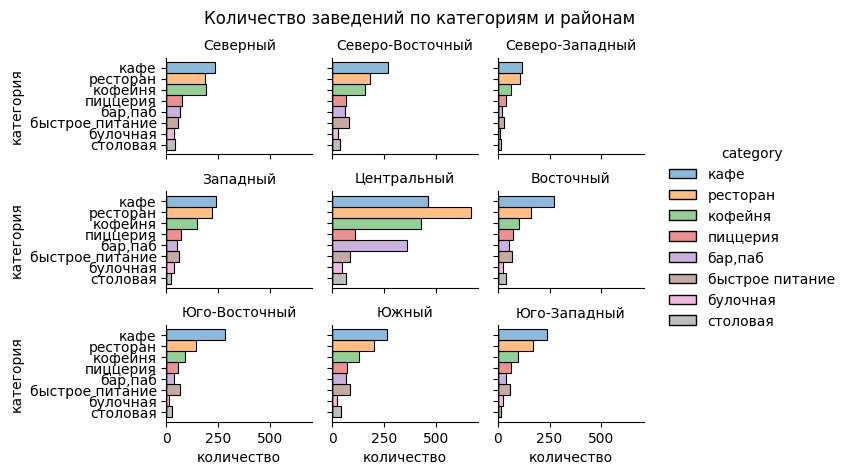

In [26]:
# визуализация количества заведений по категории и району
cat_distr = sns.displot(data=df,
                        y='category',
                        hue='category',
                        col='distr',
                        col_wrap=3,
                        height=1.6,
                        aspect=1.4)

cat_distr.set_axis_labels('количество',
                          'категория')
cat_distr.set_titles('{col_name}')
cat_distr.fig.subplots_adjust(top=.88)
cat_distr.fig.suptitle('Количество заведений по категориям и районам');

<div style="border:solid Chocolate 2px; padding: 40px">

Распределение категорий по районам повторяет общее распределение:<br>
во всех районах самые многочисленные категории - это кафе, ресторан и кофейня,<br>
а самые малочисленные - булочная и столовая.<br>
Исключением является Центральный район,<br>
в котором на первое место вышли рестораны, опередив кафе,<br>
и много баров/пабов, что заметно выделяется на фоне остальных округов.<br>

## **3.2. Количество посадочных мест**

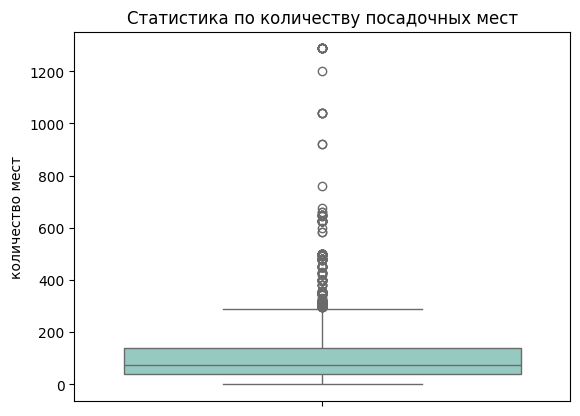

In [27]:
# визуализация статистики по количеству посадочных мест
sns.boxplot(data=df,
            y='seats',
            palette='Set3')
plt.ylabel('количество мест')
plt.title('Статистика по количеству посадочных мест');

<div style="border:solid Chocolate 2px; padding: 40px">

Основной диапазон посадочных мест находится в пределах от 40 до 140.<br>
Примерно от 300 мест начинаются выбросы, т.е., более редкие наблюдения.<br>
Есть единичные наблюдения, в которых более 800 посадочных мест.<br>
Ограничим значения по оси Y, чтобы посмотреть поближе на медиану:

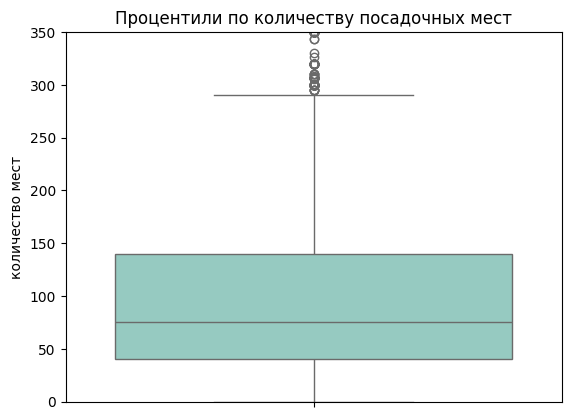

In [28]:
# визуализация по количеству мест с ограничением по оси Y
sns.boxplot(data=df,
            y='seats',
            palette='Set3')
plt.ylim(0, 350)
plt.ylabel('количество мест')
plt.title('Процентили по количеству посадочных мест');

In [29]:
# процентили по количеству посадочных мест
df.seats.quantile([.25, .50, .75, .95])

,seats
0.25,40.0
0.50,75.0
0.75,140.0
0.95,307.0


<div style="border:solid Chocolate 2px; padding: 40px">

Медиана посадочных мест по всей выборке = 75.<br>
Посмотрим на медиану для каждой категории заведений:

In [30]:
# список категорий заведений
df.category.unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [31]:
# срез данных по категориям заведений
categoryes = ['кафе', 'ресторан', 'кофейня', 'пиццерия',
              'бар,паб', 'быстрое питание',
              'булочная', 'столовая']
cat_box = df.query('category in @categoryes')

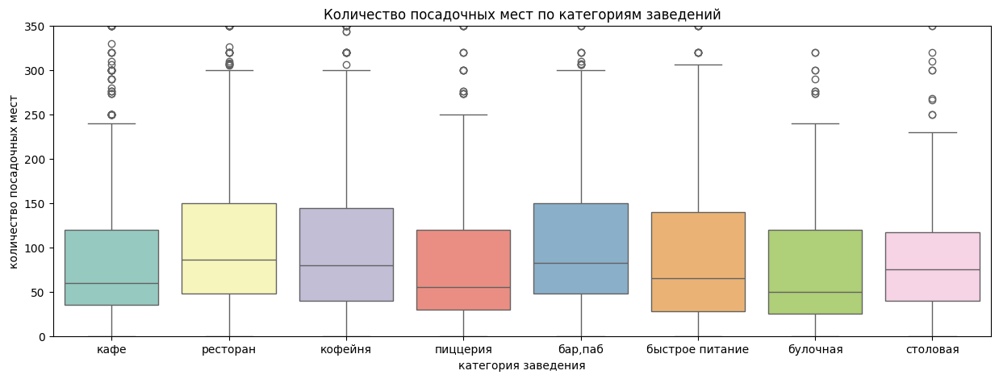

In [32]:
# визуализация статистики посадочных мест по категориям заведений
plt.subplots(figsize = (15,5))
sns.boxplot(data=cat_box,
            x='category',
            y='seats',
            palette='Set3')
plt.ylim(0,350)
plt.xlabel('категория заведения')
plt.ylabel('количество посадочных мест')
plt.title('Количество посадочных мест по категориям заведений');

In [33]:
# медианное количество посадочных мест по категориям заведений
mean_seats = (pd
              .pivot_table(df,
                           index='category',
                           values='seats',
                           aggfunc='median')
              .reset_index()
              .sort_values(by='seats', ascending=False)
              .rename(columns={'category': 'категория_заведения',
                               'seats': 'медиана_посадочных_мест'}))
mean_seats

,категория_заведения,медиана_посадочных_мест
6,ресторан,86.0
0,"бар,паб",82.5
4,кофейня,80.0
7,столовая,75.5
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


<div style="border:solid Chocolate 2px; padding: 40px">

Самая высокая медиана посадочных мест наблюдается у категории "ресторан". Следом идут "бар, паб" и "кофейня".<br>
Возможно, количество мест связано с количеством времени, которое посетители тратят на посещение заведения - <br>
чем больше времени, тем больше нужно мест.<br>
А это, в свою очередь, наводит на мысль, что в рестораны, бары и кофейни люди ходят не столько для того, чтобы просто поесть, <br>
а скорее, чтобы приятно провести время. Тогда как остальные категории заведений в большей степени служат для утоления голода. <br><br>

В целом, ящики с усами показывают, что наблюдения с количеством посадочных мест больше 300 являются выбросами. <br>
Также в датасете есть наблюдения с нулевым количеством мест и с количеством больше тысячи. <br>
Объяснить это явление достоверно на основании только лишь предоставленных данных сложно. <br>
Существуют очень маленькие заведения, которые готовят еду навынос и в них не предусмотрены посадочные места. <br>
Также существуют банкетные залы, в которых посадочных мест может быть больше тысячи.<br>
Но это очень редкие или аномальные явления.<br>
Большинство же наблюдений лежат в диапазоне от 30 до 150 посадочных мест.

## **3.3. Сетевые и несетевые заведения**

In [34]:
# исправим тип данных в столбце ['chain'] на булев тип
df.chain = df.chain.astype('bool')
df.chain.dtypes

dtype('bool')

In [35]:
# заведения, у которых название совпадает с категорией
c = df.query('name == category')
c.name.value_counts().reset_index()

,name,count
0,кафе,159
1,ресторан,33
2,столовая,22
3,кофейня,9
4,быстрое питание,2
5,пиццерия,1
6,булочная,1


<div style="border:solid Chocolate 2px; padding: 40px">

В каждой категории, кроме баров, есть заведения без собственного уникального имени.<br>
Больше всего таких среди кафе.<br>
Посмотрим, есть ли среди них сетевые:

In [36]:
cafe = len(df.query('name == "кафе" and chain == True'))
f'Количество сетевых среди заведений с названием "кафе" = {cafe}'

'Количество сетевых среди заведений с названием "кафе" = 0'

In [37]:
rest = len(df.query('name == "ресторан" and chain == True'))
f'Количество сетевых среди заведений с названием "ресторан" = {rest}'

'Количество сетевых среди заведений с названием "ресторан" = 0'

In [38]:
din = len(df.query('name == "столовая" and chain == True'))
f'Количество сетевых среди заведений с названием "столовая" = {din}'

'Количество сетевых среди заведений с названием "столовая" = 0'

In [39]:
cof = len(df.query('name == "кофейня" and chain == True'))
f'Количество сетевых среди заведений с названием "кофейня" = {cof}'

'Количество сетевых среди заведений с названием "кофейня" = 0'

In [40]:
fast = len(df.query('name == "быстрое питание" and chain == True'))
f'Количество сетевых среди заведений с названием "быстрое питание"= {fast}'

'Количество сетевых среди заведений с названием "быстрое питание"= 3'

In [41]:
pizz = len(df.query('name == "пиццерия" and chain == True'))
f'Количество сетевых среди заведений с названием "пиццерия" = {pizz}'

'Количество сетевых среди заведений с названием "пиццерия" = 0'

In [42]:
bak = len(df.query('name == "булочная" and chain == True'))
f'Количество сетевых среди заведений с названием "булочная" = {bak}'

'Количество сетевых среди заведений с названием "булочная" = 0'

<div style="border:solid Chocolate 2px; padding: 40px">

В выборке есть 3 сетевых заведения с названием "быстрое питание".

In [43]:
# соотношение сетевых и несетевых заведений
ch = df.chain.value_counts().reset_index()
ch.columns = ['сеть', 'количество']

In [44]:
# визуализация соотношения сетевых и несетевых заведений
pie(ch, 'количество', 'сеть', 'Сетевые(True) и несетевые(False) заведения')

In [45]:
# сводная таблица по категориям сетевых и несетевых заведений
chain_cat = df.pivot_table(index='category',
                           columns='chain',
                           values='name',
                           aggfunc='count')
chain_cat.columns = ['несетевые', 'сетевые']

# добавим доли
chain_cat['доля_несетевых'] = ((chain_cat['несетевые']
                               /(chain_cat['несетевые']
                               +chain_cat['сетевые'])
                               *100)).round(2)

chain_cat['доля_сетевых'] = ((chain_cat['сетевые']
                             /(chain_cat['несетевые']
                             +chain_cat['сетевые'])
                             *100)).round(2)

chain_cat = chain_cat.sort_values(by='доля_сетевых', ascending=False)
chain_cat

,несетевые,сетевые,доля_несетевых,доля_сетевых
category,,,,
булочная,99,157,38.67,61.33
пиццерия,303,330,47.87,52.13
кофейня,693,720,49.04,50.96
быстрое питание,371,232,61.53,38.47
ресторан,1313,729,64.30,35.70
кафе,1599,779,67.24,32.76
столовая,227,88,72.06,27.94
"бар,паб",596,169,77.91,22.09


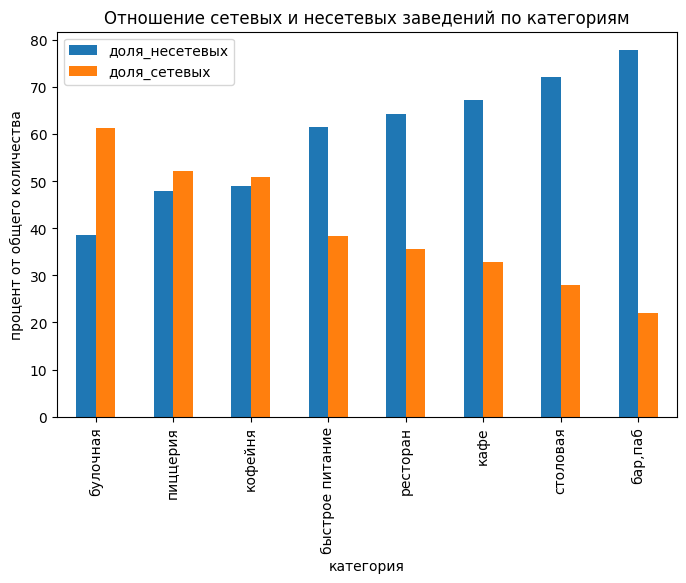

In [46]:
# диаграмма для отношения сетевых и несетевых заведений по категориям
chain_cat = chain_cat[['доля_несетевых', 'доля_сетевых']]
chain_cat.plot(kind = 'bar',
               title='Отношение сетевых и несетевых заведений по категориям',
               xlabel='категория',
               ylabel='процент от общего количества',
               figsize = (8, 5));

<div style="border:solid Chocolate 2px; padding: 40px">

Сетевых заведений значительно меньше, чем несетевых.<br>
Среди булочных, пиццерий и кофеен преобладают сетевые.<br>
В остальных категориях сети встречаются реже, особенно среди баров.

## **3.4. Топ-15 сетей в Москве по количеству точек присутствия**

In [47]:
# срез данных для сетевых заведений
chain = df.query('chain == True')
chain = (chain['name']
         .value_counts()
         .head(15)
         .reset_index()
         .sort_values(by='count')
         .rename(columns={'name': 'название_сети',
                          'count': 'количество_точек'}))

In [48]:
# диаграмма для лидеров по количеству точек присутствия
visual(chain,
       'количество_точек',
       'название_сети',
       'количество_точек',
       'Топ-15 сетей по количеству точек присутствия в Москве',
       'количество заведений',
       'название сети')

<div style="border:solid Chocolate 2px; padding: 40px">

С заметным отрывом лидирует сеть кофеен "Шоколадница" - 120 заведений.<br>
Выделим лидеров в отдельный срез и посмотрим распределение категорий заведений по районам:

In [49]:
# список с названиями сетей из Топ-15
top_list = chain.название_сети.tolist()

# срез данных для заведений из Топ-15
top = df.query('name == @top_list')

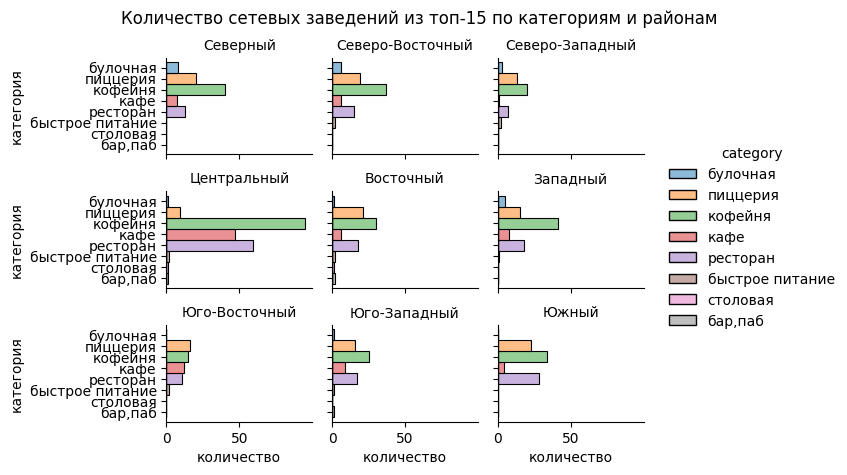

In [50]:
# визуализация количества заведений по категории и району
# для сетевых заведений из Топ-15
top_distr = sns.displot(data=top,
                        y='category',
                        hue='category',
                        col='distr',
                        col_wrap=3,
                        height=1.6,
                        aspect=1.4)

top_distr.set_axis_labels('количество', 'категория')
top_distr.set_titles('{col_name}')
top_distr.fig.subplots_adjust(top=.88)
top_distr.fig.suptitle('Количество сетевых заведений из топ-15 по категориям и районам');

In [51]:
c = df.query('chain == True')
c = c.name.value_counts().reset_index()
c = c.query('count == 1')
f'Количество сетей только с одним заведением = {len(c)}'

'Количество сетей только с одним заведением = 62'

In [52]:
c.name.unique()

array(['мясо на углях', 'уйгурский лагман', 'крепери', 'парк',
       'ливан хаус', 'bigсуши', 'zafferano', 'home',
       'хинкальная экспресс', 'харчевниковъ', 'поминальная трапеза',
       'диана', 'сказка', '1-я креветочная', 'чайхана хан', 'чай', 'баку',
       'ploveberry', 'кофейник', 'китчен', 'suшi', 'роллофф',
       'easy pizza', 'чайхана-24', 'drive', 'суши таун', 'кинобар',
       'миндаль', 'vintage', 'kimpab', 'шашлыки', '4 сезона',
       'любовь и сладости', 'wаурма', 'дастархан', 'more poke',
       'суши wok', 'хинкали', 'tasty thai', 'бюро пиццы', 'городок',
       'мореморе', 'пивбар', 'halal food', 'бакинский дворик', 'виолино',
       'суши-пицца 312', 'в своей тарелке', 'чабан чуду', 'дайнинг холл',
       'ricers', 'bakery', 'лагман', 'рома', 'сириус', 'пицца экспресс',
       'кофе пью', 'радуга', 'барбарис', 'пекарня № 1', 'чао-пицца',
       'прованс'], dtype=object)

<div style="border:solid Chocolate 2px; padding: 40px">

В датасете присутствуют 62 заведения, которые обозначены как сетевые, но при этом в Москве представлены только одной единственной точкой присутствия. Возможно, что это ошибка и данные заведения не являются сетевыми. А может, эти бренды имеют ещё заведения, но в других городах.<br><br>

Что касается категорий и районов, то есть районы, в которых представлены не все категории сетевых заведений из Топ-15.<br>
Например, в Южном округе присутствует только четыре категории из восьми - это кофейни, рестораны, пиццерии и кафе. Соответственно, нет топовых баров, булочных, столовых и фастфуда.<br>
В Юго-Восточном округе похожая ситуация, за исключением того, что здесь есть немного заведений быстрого питания.<br>
Все восемь категорий заведений представлены только в двух районах Москвы - Центральном и Восточном.<br>
Из топовых заведений больше всего кофеен во всех районах, кроме Юго-Восточного, в котором больше пиццерий.<br>
В целом, в большинстве районов мы видим четвёрку лидеров по категориям - кофейни, кафе, рестораны и пиццерии. Только в Северном районе булочных больше, чем пиццерий.

In [53]:
# категории заведений из Топ-15 популярных сетей
top_cat = (top['category']
           .value_counts()
           .reset_index()
           .rename(columns={'category': 'категория',
                            'count': 'количество'})
           .sort_values(by='количество'))

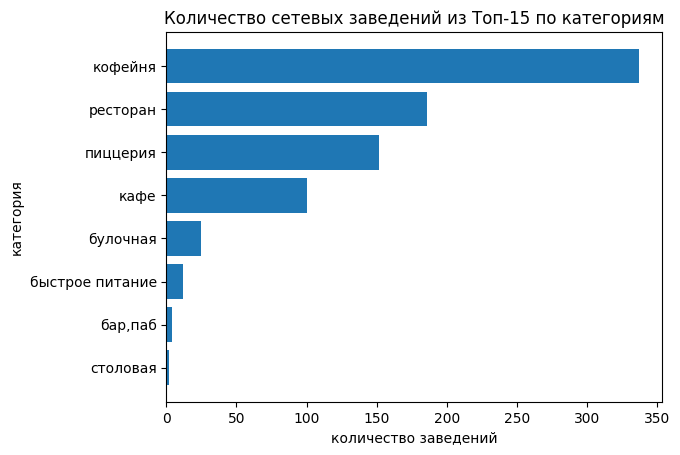

In [54]:
# количество топовых сетевых заведений по категориям
plt.barh(top_cat['категория'], top_cat['количество']);
plt.title('Количество сетевых заведений из Топ-15 по категориям')
plt.xlabel('количество заведений')
plt.ylabel('категория')
plt.show();

<div style="border:solid Chocolate 2px; padding: 40px">

Самой многочисленной категорией заведений среди топовых сетей является кофейня.<br>
Не смотря на то, что в целом среди булочных сетевых заведений больше, чем несетевых, но в Топ-15 они лишь на 5 месте. <br>
Видимо потому, что сети у булочных не такие многочисленные, как у кофеен и ресторанов.<br>
Среди ресторанов мало сетевых, но за счет обширности этих сетей они и попали в Топ-15.

## **3.5. Средний рейтинг заведений**

In [55]:
# статистика по столбцу ['rating'] - рейтинг заведения
df.rating.describe()

,rating
count,8405.000000
mean,4.229899
std,0.470376
min,1.000000
25%,4.100000
50%,4.300000
75%,4.400000
max,5.000000


### **По категориям**

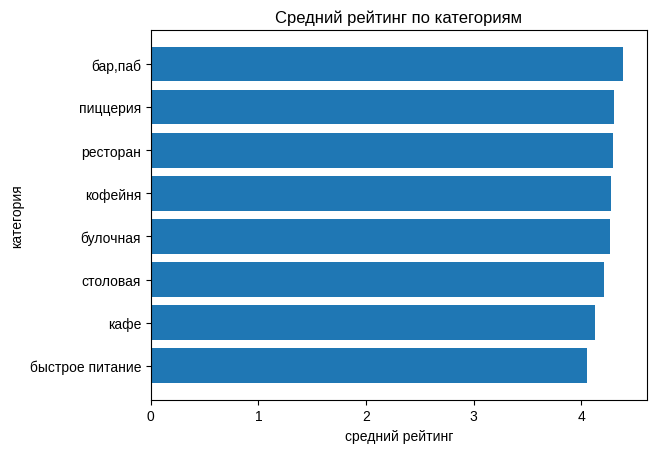

In [56]:
# средний рейтинг по категориям
r = (df
     .groupby('category')['rating']
     .mean()
     .reset_index()
     .sort_values(by='rating'))
plt.barh(r['category'], r['rating']);
plt.title('Средний рейтинг по категориям')
plt.xlabel('средний рейтинг')
plt.ylabel('категория')
plt.style.use('seaborn-whitegrid')
plt.show();

### **По районам**

In [57]:
# средний рейтинг по районам
rat = (df
       .groupby('district', as_index=False)['rating']
       .agg('mean'))
rat

,district,rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181551
2,Северный административный округ,4.239822
3,Северо-Восточный административный округ,4.148260
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


<div style="border:solid Chocolate 2px; padding: 40px">

Средний рейтинг не сильно отличается - по всем категориям он примерно одинаковый. <br>
Чуть больше у баров/пабов, чуть меньше у фастфуда.<br>
Самый низкий средний рейтинг наблюдается у заведений в Юго-Восточном округе Москвы,<br>
самый высокий - в Центральном.

## **3.6. Карта со всеми заведениями Москвы**

In [58]:
# импорт библиотеки
from folium import Map, Marker
# импорт кластера
from folium.plugins import MarkerCluster

# широта и долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# карта Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# добавление пустого кластера на карту
marker_cluster = MarkerCluster().add_to(m)

# функция, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

## **3.7. Топ-15 улиц по количеству заведений**

In [59]:
f'Количество уникальных названий улиц = {len(df.street.unique())}'

'Количество уникальных названий улиц = 1448'

In [60]:
# сводная таблица с количеством заведений по категориям для каждой улицы Москвы
streets = (df
           .pivot_table(index='street',
                        values='name',
                        columns='category',
                        aggfunc='count')
           .reset_index())

# столбец с суммой всех заведений для каждой улицы
streets['sum'] = streets[['бар,паб', 'булочная',
                          'быстрое питание', 'кафе',
                          'кофейня', 'пиццерия',
                          'ресторан', 'столовая']].sum(axis=1)

# Топ-15 улиц с наибольшим числом заведений
streets_15 = (streets
              .sort_values(by='sum', ascending=False)
              .head(15))

In [61]:
# Визуализация Топ-15 улиц по количеству заведений
visual(streets_15,
       'sum',
       'street',
       'sum',
       'Топ-15 улиц по количеству заведений',
       'количество заведений',
       'название улицы')

In [62]:
# список с названиями улиц из Топ-15
top_list_str = streets_15.street.tolist()

# срез данных для улиц из Топ-15
top_str = df.query('street == @top_list_str')

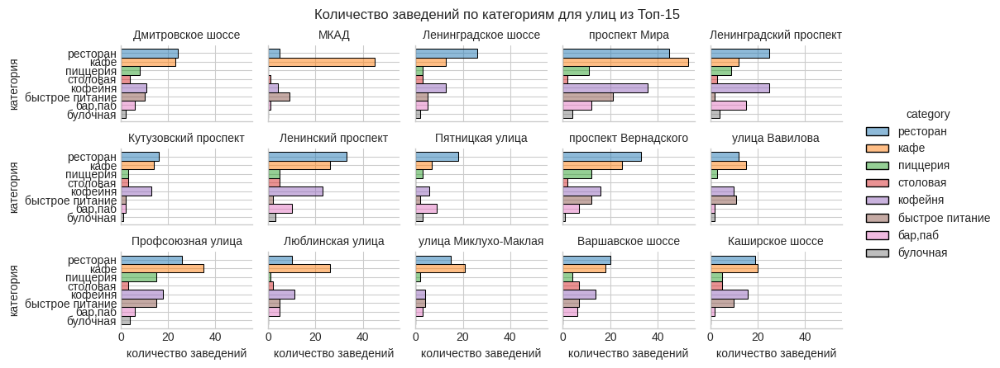

In [63]:
# визуализация количества заведений по категориям
# для улиц из Топ-15
cat_str = sns.displot(data=top_str,
                      y='category',
                      hue='category',
                      col='street',
                      col_wrap=5,
                      height=1.5,
                      aspect=1.4)

cat_str.set_axis_labels('количество заведений', 'категория')
cat_str.set_titles('{col_name}')
cat_str.fig.subplots_adjust(top=.88)
cat_str.fig.suptitle('Количество заведений по категориям для улиц из Топ-15');

## **3.8. Улицы с одним единственным заведением**


In [64]:
streets.sort_values(by='sum').head(5)

category,street,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,sum
0,1-й Автозаводский проезд,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0
683,Одинцовская улица,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0
689,Октябрьский переулок,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0
694,Ордынский тупик,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,1.0
695,Оренбургская улица,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0


<div style="border:solid Chocolate 2px; padding: 40px">

Всего в исследовании участвуют 1448 улиц, <br>
из них нашлось 458 улиц, на которых присутствуют только по одному заведению общепита.<br>
Судя по всему, это очень маленькие улочки. На них больше одного заведения и не поместится.<br><br>

Из Топ-15 улиц по количеству заведений лидером является проспект Мира. <br>
Больше всего на этой улице кафе и ресторанов. Много кофеен и заведений быстрого питания.<br>
Лидер по количеству баров - Ленинградский проспект. Следом за ним - проспект Мира.<br>
Самое большое количество столовых размещено на Варшавском шоссе.<br>
Меньше всего кофеен находится на МКАД, <br>
но на этой улице очень много кафе - второе место после проспекта Мира.<br><br>

Есть улицы, на которых отсутствуют некоторые категории:<br>
на МКАД, Люблинской и улице Миклухо-Маклая, на Варшавском и Каширском шоссе нет ни одной булочной.<br>
На МКАД также нет пиццерий.<br>
А на Пятницкой и улицах Вавилова и Миклухо-Маклая нет столовых.

## **3.9. Средний чек**

In [65]:
# статистика по колонке "средний чек"
df.middle_avg_bill.describe()

,middle_avg_bill
count,3149.000000
mean,958.053668
std,1009.732845
min,0.000000
25%,375.000000
50%,750.000000
75%,1250.000000
max,35000.000000


In [66]:
# медианное значение среднего чека для заведений каждого района
avg_bill_dis = (df
                .groupby('district')['middle_avg_bill']
                .agg('median')
                .reset_index()
                .sort_values(by='middle_avg_bill',
                             ascending=False))
avg_bill_dis

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [67]:
# широта центра Москвы(moscow_lat),
# долгота центра Москвы(moscow_lng)
moscow_lat, moscow_lng = 55.751244, 37.618423

# создание карты Москвы
moscow_map = Map(location=[moscow_lat, moscow_lng],
                 zoom_start=10,
                 tiles='Cartodb Positron')

# построение хороплета с помощью конструктора Choropleth
Choropleth(geo_data=state_geo,
           data=avg_bill_dis,
           columns=['district',
                    'middle_avg_bill'],
           key_on='feature.name',
           fill_color='Blues',
           fill_opacity=0.8,
           legend_name='средний рейтинг').add_to(moscow_map)

# вывод карты с хороплетом
moscow_map

<div style="border:solid Chocolate 2px; padding: 40px">

Самая высокая медиана по среднему чеку находится в Центральном и Западном районе. <br>
Самая низкая - в Северо-Восточном, Южном и Юго-Восточном.<br>

# **Часть 4. Исследование кофеен**

## **4.1. Распределение кофеен по районам**

In [68]:
# сводная таблица с распределением кофеен по районам
k = df.query('category == "кофейня"')
k_distr = (k
           .groupby('district')['category']
           .count()
           .reset_index()
           .sort_values(by='category'))

f'всего кофеен = {k_distr.category.sum()}'

'всего кофеен = 1413'

In [69]:
k_distr

,district,category
4,Северо-Западный административный округ,62
6,Юго-Восточный административный округ,89
7,Юго-Западный административный округ,96
0,Восточный административный округ,105
8,Южный административный округ,131
1,Западный административный округ,150
3,Северо-Восточный административный округ,159
2,Северный административный округ,193
5,Центральный административный округ,428


In [70]:
# широта и долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# карта Москвы
m = Map(location=[moscow_lat, moscow_lng],
        zoom_start=10,
        tiles='Cartodb Positron')

# добавление на карту хороплета
Choropleth(geo_data=state_geo,
           data=k_distr,
           columns=['district',
                    'category'],
           key_on='feature.name',
           fill_color='Blues',
           fill_opacity=0.8,
           legend_name='количество кофеен').add_to(m)

# выводим карту
m

<div style="border:solid Chocolate 2px; padding: 40px">

Больше всего кофеен в центре.<br>
Меньше всего - в Северо-Западном, Юго-Западном и Юго-Восточном районах.

## **4.2. Часы работы**

In [71]:
# количество круглосуточных кофеен
k_hours = (k
           .groupby('is_24/7')['category']
           .count()
           .reset_index()
           .sort_values(by='category'))
k_hours

,is_24/7,category
1,True,59
0,False,1339


<div style="border:solid Chocolate 2px; padding: 40px">

Только 59 кофеен работают круглосуточно.

## **4.3. Рейтинги**

In [72]:
# средний рейтинг по районам
rat = k.groupby('district', as_index=False)['rating'].agg('mean')
rat

,district,rating
0,Восточный административный округ,4.282857
1,Западный административный округ,4.195333
2,Северный административный округ,4.291710
3,Северо-Восточный административный округ,4.216981
4,Северо-Западный административный округ,4.325806
5,Центральный административный округ,4.336449
6,Юго-Восточный административный округ,4.225843
7,Юго-Западный административный округ,4.283333
8,Южный административный округ,4.232824


In [73]:
# широта и долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# карта Москвы
m = Map(location=[moscow_lat, moscow_lng],
        zoom_start=10,
        tiles='Cartodb Positron')

# добавление на карту хороплета
Choropleth(geo_data=state_geo,
           data=rat,
           columns=['district',
                    'rating'],
           key_on='feature.name',
           fill_color='Blues',
           fill_opacity=0.8,
           legend_name='средний рейтинг').add_to(m)

# вывод карты с хороплетом
m

<div style="border:solid Chocolate 2px; padding: 40px">

Самые высокие средние рейтинги имеют кофейни в Центральном и Северо-Западном районах.<br>
Самый низкий средний рейтинг у кофеен из Западного округа.

## **4.4. Стоимость чашки капучино**

In [74]:
# статистика по колонке ['middle_coffee_cup']
df.middle_coffee_cup.describe()

,middle_coffee_cup
count,535.000000
mean,174.721495
std,88.951103
min,60.000000
25%,124.500000
50%,169.000000
75%,225.000000
max,1568.000000


In [75]:
# заведения, с минимальной ценой за чашку капучино
df.query('middle_coffee_cup == 60').head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7,distr
489,cofix,кофейня,"Москва, Химкинский бульвар, вл7-23",Северо-Западный административный округ,"ежедневно, 09:00–22:00",55.850811,37.444491,4.0,неизвестно,Цена чашки капучино:от 60 ₽,NaN,60.0,True,NaN,Химкинский бульвар,False,Северо-Западный
502,кафе чудо,кофейня,"Москва, Кронштадтский бульвар, 3, стр. 15",Северный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–21:00",55.839459,37.486867,4.1,неизвестно,Цена чашки капучино:от 60 ₽,NaN,60.0,False,NaN,Кронштадтский бульвар,False,Северный
518,cofix,кофейня,"Москва, Фестивальная улица, 2А",Северный административный округ,"пн-пт 07:00–23:00; сб,вс 08:00–23:00",55.854333,37.476018,3.9,неизвестно,Цена чашки капучино:от 60 ₽,NaN,60.0,True,189.0,Фестивальная улица,False,Северный
523,cofix,кофейня,"Москва, Головинское шоссе, 5к1",Северный административный округ,"ежедневно, 08:00–22:00",55.840395,37.491703,4.2,неизвестно,Цена чашки капучино:от 60 ₽,NaN,60.0,True,NaN,Головинское шоссе,False,Северный
834,cofix,кофейня,"Москва, улица Декабристов, 12",Северо-Восточный административный округ,"ежедневно, 09:30–22:00",55.863319,37.601437,4.0,неизвестно,Цена чашки капучино:от 60 ₽,NaN,60.0,True,130.0,улица Декабристов,False,Северо-Восточный


In [76]:
# заведения, с максимальной ценой за чашку капучино
df.query('middle_coffee_cup >= 1500')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7,distr
2859,шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,True,48.0,Большая Семёновская улица,False,Восточный


In [77]:
# статистика по стоимости чашки капучино для сети "шоколадница"
choc = df.query('name == "шоколадница"')
choc.middle_coffee_cup.describe()

,middle_coffee_cup
count,62.000000
mean,277.193548
std,167.721944
min,170.000000
25%,256.000000
50%,256.000000
75%,256.000000
max,1568.000000


In [78]:
# средняя стоимость чашки капучино по районам
cup = df.groupby ('district')['middle_coffee_cup'].mean().reset_index()
cup = cup.sort_values(by='middle_coffee_cup', ascending = False)
cup

,district,middle_coffee_cup
1,Западный административный округ,189.640000
5,Центральный административный округ,188.210843
7,Юго-Западный административный округ,183.485714
0,Восточный административный округ,174.023810
3,Северо-Восточный административный округ,165.333333
2,Северный административный округ,165.090909
4,Северо-Западный административный округ,160.458333
8,Южный административный округ,157.826087
6,Юго-Восточный административный округ,150.771429


In [79]:
# хороплет для средней стоимости чашки капучино по районам
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng],
        zoom_start=10,
        tiles='Cartodb Positron')
Choropleth(geo_data=state_geo,
           data=cup,
           columns=['district',
                    'middle_coffee_cup'],
           key_on='feature.name',
           fill_color='Blues',
           fill_opacity=0.8,
           legend_name='средняя стоимость чашки капучино').add_to(m)
m

## **Вывод 4**
Минимальная стоимость чашки капучино в Москве находится на уровне 60 рублей и принадлежит сети кофеен "cofix".<br>
Максимальная стоимость - 1568 руб. Такая цена указана в одной из кофеен сети "шоколадница" в Восточном районе. При этом средняя цена за капучино в этой сети равна 277 рублей.<br>
Средняя цена за чашку капучино по Москве - 175 рублей, медиана - 169 рублей.<br>
В среднем самый дорогой кофе подают в Западном, Центральном и Юго-Западном районах.<br>
Самый дешевый - в Южном и Юго-Восточном.<br>
Самый высокий средний рейтинг имеют кофейни в Центральном и Северо-Заподном районах Москвы. Самый низкий - в Западном.<br>
Круглосуточных кофеен довольно мало - всего 59 из 1413 заведений (4%).<br>
По количеству больше всего кофеен находится в Центральном округе, а меньше всего - в Северо-Западном.

Самым перспективным районом Москвы по части открытия кофейни выглядит Северо-Западный административный округ. По количеству населения он занимает 8-е место среди всех округов Москвы, а по плотности - 6-е (возможно потому, что 46% площади этого района занимают природные ландшафты — лесопарковые массивы, водоёмы, заповедные зоны.<br>
В Северо-Западном районе кроме жилых массивов есть бизнес-парки, промышленные предприятия, научно-технические и исследовательские институты. То есть, помимо постоянно проживающих, район посещают по работе люди из других округов Москвы. <br>
По стоимости за чашку капучино лучше придерживаться средней стоимости по Северо-Западному району - 160 рублей.<br>
По часам работы - в этом районе нет смысла открывать круглосуточные заведения, но стоит учитывать часы работы сотрудников предприятий и бизнес-парков. Основную ставку лучше делать на часы перед началом рабочей смены, после окончания и обеденный перерыв.<br>
Также можно дополнительно исследовать так называемые окраины, где находятся конечные остановки общественного транспорта и Депо, с целью открытия заведений, ориентированных на сотрудников транспортных служб.<br>
Можно подумать о сети кофеен по всем окраинам Москвы всех районов, а не только Северо-Западного.

# **Часть 5. Общий вывод**

Самый насыщенный по количеству заведений общественного питания район Москвы, ожидаемо, Центральный административный округ. Из категорий здесь преобладают рестораны.<br>
Но если смотреть на категории в целом, то в Москве больше всего кафе. На втором месте - рестораны.<br>
Меньше всего - булочных и столовых.<br><br>
Больше всего заведений находится на проспекте Мира.<br>
А вот самая длинная улица Москвы, Варшавское шоссе, по количеству заведений только на 8 месте. Зато здесь самое большое количество столовых.<br>
Лидер по количеству баров - Ленинградский проспект.<br><br>
Из открытых источников известно, что в Москве более пяти тысяч улиц.
В нашей выборке представлено только 1440. И из них 458 улиц имеют только по одному заведению общепита, преимущественно, кафе.<br><br>
Несетевых заведений в Москве больше, чем сетевых.<br>
Сетевыми чаще всего бывают булочные, пиццерии и кофейни.<br>
Самая популярная сеть в Москве - кофейни "Шоколадница".<br><br>
Средний чек по Москве находится в пределах 958 рублей. Медиана среднего чека по районам значительно различается - 1000 рублей для Центрального и Западного районов и 450 рублей для Юго-восточного.<br><br>
Средний рейтинг заведений не сильно отличается - по всем категориям он примерно одинаковый. Чуть больше у баров/пабов, чуть меньше у фастфуда.<br>

# **Часть 6. Рекомендации**

В связи с повсеместным распространением служб доставки готовой еды следует продуманно подходить к основной цели открытия заведения общественного питания. Таких целей из самых базовых можно выделить две:
- утолить голод,
- обеспечить досуг.<br>
<br>
Если человеку нужно просто поесть, он скорее всего закажет еду на дом или купит что-то навынос. В таком случае нет необходимости открывать заведение с большим количеством посадочных мест, но стоит подумать о специфике меню (национальная кухня, "вкусно как у бабушки" и т.п.), а также о возможности круглосуточной работы.<br><br>
Но люди ходят в заведения не только ради еды, но и с целью приятно провести время в компании других людей. В таком случае лучше четко определится, какой вид общения будет удовлетворять новое заведение - деловые или романтические встречи, совместный просмотр спортивных мероприятий, клуб по интересам, корпоративы, свадьбы, детские праздники и т.д.<br><br>
Выбрав тип досуга, далее следует подумать, в каком районе заведение будет более востребованным. Для этого нужно изучить инфраструктуру и количество конкурентов. И далее уже продумать особенные "фишки", которые выделят заведение из массы подобных и помогут качественнее удовлетворять выбранную потребность клиента.<br><br>
Также можно попробовать создать что-то новое, чего ещё не было. Например, когда-то не существовало спорт-баров и фанаты смотрели матчи в одиночку или в компании нескольких друзей, нервируя домочадцев и соседей. А всего-то нужно было установить в баре большой экран и крутить по нему матчи.<br><br>
Интересы у людей крайне разнообразны. Поэтому тематические бары или тематические кофейни выглядят очень перспективно.